<h1>Cassava and Tomato Disease Detection</h1>

<h3>Loading the dataset</h3>
<h5>Cassava Data from Makerere AI Lab and Tomato Data from The Plant Village</h5>
<h5>Links to Dataset</h5>
<a href="https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/R0KL7R">Mak AI LAb Dataset</a> <br>
<a href="https://www.kaggle.com/datasets/emmarex/plantdisease">Plant Village Dataset</a>
<h5>Data was preprocessed and saved in a zip file available on github</h5>
<a href="https://raw.githubusercontent.com/IvanOjok/Crop-Disease-Detection/main/Crop_Disease_Dataset.zip">Preprocessed Dataset</a>

In [1]:
#Loading the dataset
%pip install wget
import wget
wget.download("https://raw.githubusercontent.com/IvanOjok/Crop-Disease-Detection/main/Crop_Disease_Dataset.zip")

Note: you may need to restart the kernel to use updated packages.
100% [....................................................] 74985389 / 74985389

'Crop_Disease_Dataset.zip'

In [2]:
!unzip Crop_Disease_Dataset.zip
print("************** Dataset Finally Loaded *****************")

Archive:  Crop_Disease_Dataset.zip
   creating: Crop_Disease_Dataset/
   creating: Crop_Disease_Dataset/Cassava_Mosaic/
  inflating: __MACOSX/Crop_Disease_Dataset/._Cassava_Mosaic  
   creating: Crop_Disease_Dataset/Tomato_Healthy/
  inflating: __MACOSX/Crop_Disease_Dataset/._Tomato_Healthy  
   creating: Crop_Disease_Dataset/Tomato_Early_Blight/
  inflating: __MACOSX/Crop_Disease_Dataset/._Tomato_Early_Blight  
  inflating: Crop_Disease_Dataset/.DS_Store  
  inflating: __MACOSX/Crop_Disease_Dataset/._.DS_Store  
   creating: Crop_Disease_Dataset/Cassava_Brown_Streak/
  inflating: __MACOSX/Crop_Disease_Dataset/._Cassava_Brown_Streak  
   creating: Crop_Disease_Dataset/Cassava_Healthy/
  inflating: __MACOSX/Crop_Disease_Dataset/._Cassava_Healthy  
   creating: Crop_Disease_Dataset/Tomato_Bacterial_Spot/
  inflating: __MACOSX/Crop_Disease_Dataset/._Tomato_Bacterial_Spot  
  inflating: Crop_Disease_Dataset/Cassava_Mosaic/1616822846487 (1).jpg  
  inflating: __MACOSX/Crop_Disease_Dataset/C

In [3]:
#importing and installing necessary libraries
%pip install split-folders      #split folders into train and test
import splitfolders
import os                       # for working with files
import numpy as np              # for numerical computationss
import torch                    # Pytorch module
import pandas as pd             # for working with dataframes
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from PIL import Image           # for checking images
import torch.nn.functional as F # for functions for calculating loss
import torchvision.transforms as transforms   # for transforming images into tensors
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torch import optim
from torch.utils.data import DataLoader
from tqdm import tqdm
import torchvision
import PIL
import sys

#os.environ['KMP_DUPLICATE_LIB_OK']='True'    #prevents error "Jupyter | The kernel appears to have died. It will restart automatically |"

Note: you may need to restart the kernel to use updated packages.


In [4]:
!pwd

/Users/ojokivan/anaconda_projects/bf0a50cf-4010-4246-88b2-da3b25189b12


In [5]:
!ls

Crop_Disease_Dataset         __MACOSX
Crop_Disease_Dataset.zip     crop_disease_detection.ipynb
Shap_and_Lime.ipynb          heart.csv


In [7]:
##Determine the number of diseases available
input_folder = "/Users/ojokivan/anaconda_projects/bf0a50cf-4010-4246-88b2-da3b25189b12/Crop_Disease_Dataset"

diseases = os.listdir(input_folder)
diseases

['Cassava_Mosaic',
 'Tomato_Healthy',
 'Tomato_Early_Blight',
 '.DS_Store',
 'Cassava_Brown_Streak',
 'Cassava_Healthy',
 'Tomato_Bacterial_Spot']

In [8]:
#Determine the number of images in each class for both train and test
diseases.remove('.DS_Store')
nums = {}
for disease in diseases:
    nums[disease] = len(os.path.join(input_folder,disease)) #os.listdir(train_dir + '/' + disease))

# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["Images"])
img_per_class

,Images
Cassava_Mosaic,106
Tomato_Healthy,106
Tomato_Early_Blight,111
Cassava_Brown_Streak,112
Cassava_Healthy,107
Tomato_Bacterial_Spot,113


Text(0.5, 1.0, 'Images per each class of plant disease')

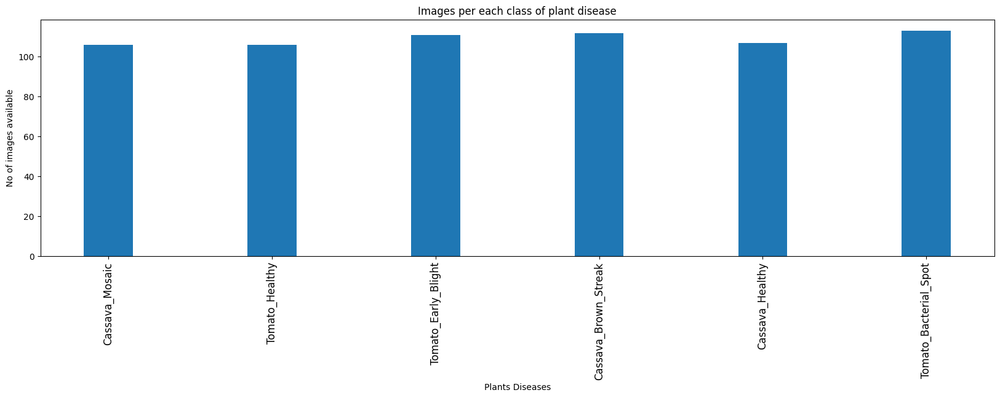

In [9]:
# plotting number of images available for each disease
index = [n for n in range(6)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, diseases, fontsize=12, rotation=90)
plt.title('Images per each class of plant disease')

In [50]:
from skimage.transform import resize
from skimage.io import imread
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

<h3>Data Preprocessing for Multiclass SVM</h1>

In [11]:
flat_data_arr=[] #input array
target_arr=[] #output array

for i in diseases:

    print(f'loading... category : {i}')
    path=os.path.join(input_folder,i)
    unwantedfile = os.path.join(path,".DS_Store")
    if os.path.exists(unwantedfile):
        os.remove(unwantedfile)
        print(f"File '{unwantedfile}' deleted successfully.")

    for img in os.listdir(path):
        img_array=imread(os.path.join(path,img))
        img_resized=resize(img_array,(256,256,3))
        flat_data_arr.append(img_resized.flatten())
        target_arr.append(diseases.index(i))
    print(f'loaded category:{i} successfully')
flat_data=np.array(flat_data_arr)
target=np.array(target_arr)
df=pd.DataFrame(flat_data) #dataframe
df['Target']=target
x=df.iloc[:,:-1] #input data
y=df.iloc[:,-1] #output data
x, y

loading... category : Cassava_Mosaic
File '/Users/ojokivan/anaconda_projects/bf0a50cf-4010-4246-88b2-da3b25189b12/Crop_Disease_Dataset/Cassava_Mosaic/.DS_Store' deleted successfully.
loaded category:Cassava_Mosaic successfully
loading... category : Tomato_Healthy
File '/Users/ojokivan/anaconda_projects/bf0a50cf-4010-4246-88b2-da3b25189b12/Crop_Disease_Dataset/Tomato_Healthy/.DS_Store' deleted successfully.
loaded category:Tomato_Healthy successfully
loading... category : Tomato_Early_Blight
File '/Users/ojokivan/anaconda_projects/bf0a50cf-4010-4246-88b2-da3b25189b12/Crop_Disease_Dataset/Tomato_Early_Blight/.DS_Store' deleted successfully.
loaded category:Tomato_Early_Blight successfully
loading... category : Cassava_Brown_Streak
File '/Users/ojokivan/anaconda_projects/bf0a50cf-4010-4246-88b2-da3b25189b12/Crop_Disease_Dataset/Cassava_Brown_Streak/.DS_Store' deleted successfully.
loaded category:Cassava_Brown_Streak successfully
loading... category : Cassava_Healthy
File '/Users/ojokivan

(        0         1         2         3         4         5         6       \
 0     0.892166  0.786284  0.856030  0.893294  0.789582  0.839513  0.657847   
 1     0.632618  0.592516  0.492182  0.630376  0.573468  0.494259  0.653022   
 2     0.703903  0.739115  0.557530  0.805737  0.844580  0.646597  0.802972   
 3     0.423522  0.324518  0.310976  0.513287  0.442421  0.328351  0.500384   
 4     0.453146  0.366872  0.378637  0.525103  0.438829  0.450593  0.541094   
 ...        ...       ...       ...       ...       ...       ...       ...   
 1928  0.666667  0.647059  0.670588  0.670588  0.650980  0.674510  0.674510   
 1929  0.545098  0.537255  0.549020  0.549020  0.541176  0.552941  0.545098   
 1930  0.662745  0.647059  0.650980  0.576471  0.560784  0.564706  0.592157   
 1931  0.572549  0.576471  0.584314  0.564706  0.568627  0.576471  0.556863   
 1932  0.658824  0.619608  0.611765  0.658824  0.619608  0.611765  0.658824   
 
         7         8         9       ...    196598

In [12]:
#split train and test data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42,stratify=y)
print('Splitted Successfully')

Splitted Successfully


In [51]:
#Normalize data using StandardScaler
ss = StandardScaler()

x_train = ss.fit_transform(x_train)
x_test= ss.transform(x_test)

<h3>Model Training</h3>

In [52]:
# Train the SVM model
# Initialize the SVM classifier with One-vs-All strategy
svm_model = svm.SVC(decision_function_shape='ovr')
svm_model.fit(x_train, y_train)

,C,1.0
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


<h3>Model Performance and Evaluation</h3>

In [53]:
# Make predictions
# Predict and evaluate the One-vs-All model
y_pred = svm_model.predict(x_test)

# Evaluate performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=diseases)

print("Model Accuracy:", accuracy)

print("SVM Classification Report")
print(classification_report(y_test, y_pred, target_names=diseases))

Model Accuracy: 0.7545219638242894
              precision    recall  f1-score   support

           0       0.61      0.62      0.61        68
           1       0.94      0.99      0.96        69
           2       0.91      0.78      0.84        63
           3       0.66      0.62      0.63        65
           4       0.62      0.65      0.63        62
           5       0.80      0.88      0.84        60

    accuracy                           0.75       387
   macro avg       0.76      0.75      0.75       387
weighted avg       0.76      0.75      0.75       387



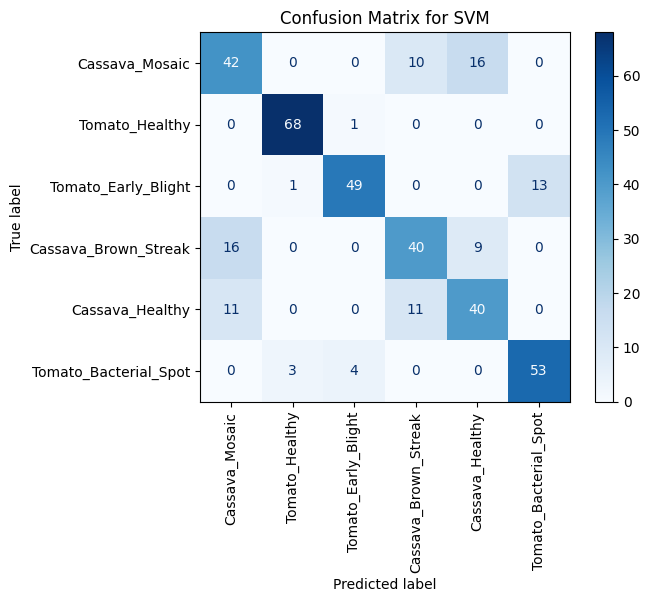

In [55]:
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=diseases)
disp.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=90)
plt.title("Confusion Matrix for SVM")
plt.show()

<h4> Selecting best Hyperparameter for model training </h4>
<h5>Run next 3 cells with good compute resources</h5>

In [ ]:
#creating the model and defining hyperparameters for model evaluation
param_grid={'C':[0.1,1,10,100],'gamma':[0.0001,0.001,0.1,1],'kernel':['rbf','poly']}
svc=svm.SVC(decision_function_shape='ovr')
model=GridSearchCV(svc,param_grid)

<h4> Model training With Hyperparameter tuning </h4>

In [ ]:
model.fit(x_train,y_train)
print('The Model is trained well with the given images')
# model.best_params_ contains the best parameters obtained from GridSearchCV

<h4> Model evaluation </h4>

In [ ]:
y_pred=model.predict(x_test)
print("The predicted Data is :")
print(y_pred)
print("The actual data is:")
print(np.array(y_test))
print(f"The model is {accuracy_score(y_pred,y_test)*100}% accurate")

<h3>Data Preprocessing for Standard CNN and ResNet50 </h1>

In [ ]:
# Splitting Data into train and test. Define input and output folders after
#input_folder = "/Users/ojokivan/anaconda_projects/2737eb7b-8e67-4804-91f4-1f37c8da1c5c/Crop_Disease_Dataset"
output = "/content/Dataset" # A new folder will be created

# Split with a ratio of 80% train and 20% test
# The order of the ratio is train, test.
splitfolders.ratio(input_folder, output=output, seed=42, ratio=(0.8, 0.2), move=False)

# For train/validation/test split (e.g., 70/15/15)
# splitfolders.ratio(input_folder, output=output, seed=42, ratio=(0.7, 0.15, 0.15), move=False)

Copying files: 1933 files [00:02, 808.09 files/s]


In [ ]:
#Determine the number of available classes (diseases) to predict
train_dir = output + "/train"
test_dir = output + "/val"
diseases = os.listdir(train_dir)
diseases

['Tomato_Healthy',
 'Cassava_Healthy',
 'Tomato_Bacterial_Spot',
 'Tomato_Early_Blight',
 'Cassava_Brown_Streak',
 'Cassava_Mosaic']

In [59]:
# resize datasets for validation and training
# Define a transform to resize all images to a fixed size of 256x256
# Normalize the image to a mean of 0 and standard deviation of [-1, 1]
mean = (0.5,)
std = (0.5,)
transform_resize = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

train = ImageFolder(train_dir, transform=transform_resize)
test = ImageFolder(test_dir, transform=transform_resize)

In [60]:
img, label = train[0]
print(img, label)
#len(train.classes)

tensor([[[ 0.2000,  0.1686,  0.0980,  ...,  0.2627,  0.2078,  0.2078],
         [ 0.1059,  0.0667,  0.0510,  ...,  0.2000,  0.2235,  0.1373],
         [ 0.0588,  0.0588,  0.0431,  ...,  0.0980,  0.1216,  0.0275],
         ...,
         [-0.5686, -0.5294, -0.4588,  ..., -0.0980,  0.0667,  0.2000],
         [-0.5922, -0.6314, -0.5608,  ..., -0.0745, -0.0039,  0.1294],
         [-0.5843, -0.7020, -0.6549,  ..., -0.0431, -0.0667, -0.0745]],

        [[ 0.3255,  0.2941,  0.2392,  ...,  0.1059,  0.0510,  0.0510],
         [ 0.2392,  0.2000,  0.1922,  ...,  0.0431,  0.0667, -0.0196],
         [ 0.2000,  0.2000,  0.1922,  ..., -0.0667, -0.0353, -0.1294],
         ...,
         [-0.7176, -0.6863, -0.6157,  ..., -0.2706, -0.1137,  0.0118],
         [-0.7255, -0.7647, -0.7098,  ..., -0.2392, -0.1765, -0.0510],
         [-0.7176, -0.8353, -0.7961,  ..., -0.2078, -0.2471, -0.2627]],

        [[ 0.0431,  0.0196, -0.0275,  ...,  0.2000,  0.1451,  0.1451],
         [-0.0353, -0.0667, -0.0667,  ...,  0

In [61]:
from torch.utils.data import DataLoader # for dataloaders
# setting the batch size
batch_size = 25 #batch_size is the total number of images given as input at once in forward propagation of the CNN.


# DataLoaders for training and validation

#DataLoader is a subclass which comes from torch.utils.data. It helps in loading large and memory consuming datasets. It takes in batch_size which denotes the number of samples contained in each generated batch.
#Setting shuffle=True shuffles the dataset. It is heplful so that batches between epochs do not look alike. Doing so will eventually make our model more robust.
#num_workers, denotes the number of processes that generate batches in parallel. If you have more cores in your CPU, you can set it to number of cores in your CPU. Since, Kaggle provides a 2 core CPU, I have set it to 2

train_dl = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
test_dl = DataLoader(test, batch_size, num_workers=2, pin_memory=True)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


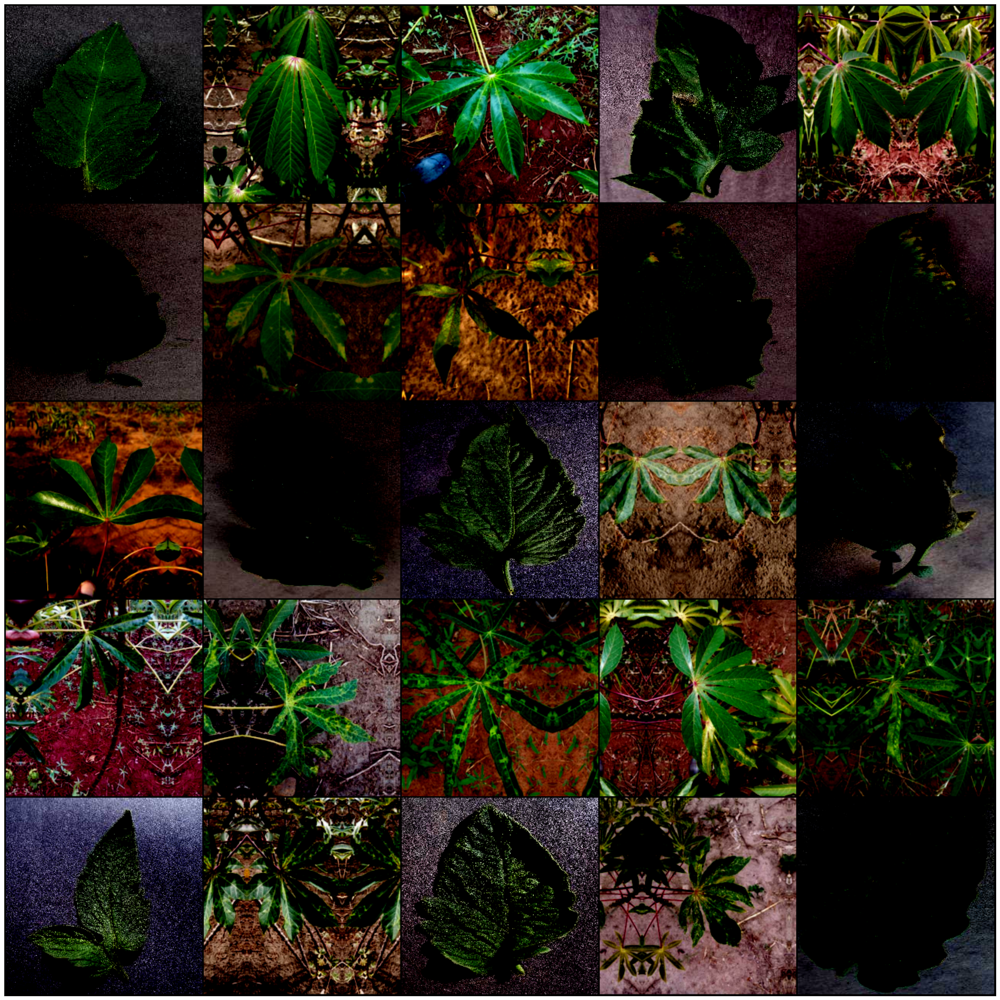

In [62]:
# helper function to show a batch of training instances
def show_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=5).permute(1, 2, 0))
        break

show_batch(train_dl)

<h3>Model Training</h3>

In [63]:
#Defining the Standard CNN architecture
class CNN(nn.Module):
   def __init__(self, in_channels, num_classes):

        # in_channels: Number of channels in the input image (for grayscale images, 1)
        # num_classes: Number of classes to predict.
       
       super(CNN, self).__init__()

       # 1st convolutional layer
       self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=16, kernel_size=4, padding=1)
       # Max pooling layer
       self.pool = nn.MaxPool2d(kernel_size=4, stride=4)
       # 2nd convolutional layer
       self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=4, padding=1)
       # Fully connected layer (in features, out puts the different classes)

       self.fc1 = nn.Linear(7200, 2400)
       self.fc2 = nn.Linear(2400, 120)
       self.fc3 = nn.Linear(120, num_classes)
       #self.fc1 = nn.functional.softmax(dim=0)

   def forward(self, x):
       """
       Define the forward pass of the neural network.

       Parameters:
           x: Input tensor.

       Returns:
           torch.Tensor
               The output tensor after passing through the network.
       """
       x = F.relu(self.conv1(x))  # Apply first convolution and ReLU activation
       x = self.pool(x)           # Apply max pooling
       x = F.relu(self.conv2(x))  # Apply second convolution and ReLU activation
       x = self.pool(x)           # Apply max pooling
       x = x.reshape(x.shape[0], -1)  # Flatten the tensor
       x = self.fc1(x)            # Apply fully connected layer
       x = self.fc2(x)
       x = self.fc3(x)
       return nn.functional.log_softmax(x, dim=1)

In [64]:
#where the model should be run (cpu or gpu)
device = "cuda" if torch.cuda.is_available() else "cpu"

model = CNN(in_channels=3, num_classes=len(diseases)).to(device)
print(model)

CNN(
  (conv1): Conv2d(3, 16, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=7200, out_features=2400, bias=True)
  (fc2): Linear(in_features=2400, out_features=120, bias=True)
  (fc3): Linear(in_features=120, out_features=6, bias=True)
)


In [65]:
# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [66]:
#Training the model
num_epochs=10
for epoch in range(num_epochs):
 # Iterate over training batches
   print(f"Epoch [{epoch + 1}/{num_epochs}]")

   for batch_index, (data, targets) in enumerate(tqdm(train_dl)):
       data = data.to(device)
       targets = targets.to(device)
       scores = model(data)
       loss = criterion(scores, targets)
       optimizer.zero_grad()
       loss.backward()
       optimizer.step()

Epoch [1/10]


100%|███████████████████████████████████████████| 62/62 [01:33<00:00,  1.51s/it]


Epoch [2/10]


100%|███████████████████████████████████████████| 62/62 [01:49<00:00,  1.77s/it]


Epoch [3/10]


100%|███████████████████████████████████████████| 62/62 [01:29<00:00,  1.45s/it]


Epoch [4/10]


100%|███████████████████████████████████████████| 62/62 [01:30<00:00,  1.46s/it]


Epoch [5/10]


100%|███████████████████████████████████████████| 62/62 [01:31<00:00,  1.48s/it]


Epoch [6/10]


100%|███████████████████████████████████████████| 62/62 [01:27<00:00,  1.42s/it]


Epoch [7/10]


100%|███████████████████████████████████████████| 62/62 [01:20<00:00,  1.29s/it]


Epoch [8/10]


100%|███████████████████████████████████████████| 62/62 [01:21<00:00,  1.31s/it]


Epoch [9/10]


100%|███████████████████████████████████████████| 62/62 [01:21<00:00,  1.31s/it]


Epoch [10/10]


100%|███████████████████████████████████████████| 62/62 [01:22<00:00,  1.32s/it]


<h3>Model Performance and Evaluation</h3>

In [71]:
from sklearn.metrics import confusion_matrix

all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
  for images, labels in test_dl:
    outputs = model(images)
    _, predicted = torch.max(outputs.data, 1) # Get predicted class indices
    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

report = classification_report(all_labels, all_preds, target_names=diseases)
accuracy = accuracy_score(all_labels, all_preds)
print(f"Accuracy: {accuracy*100} %")
print("CNN Classification Report")
print(report)

Accuracy: 73.96907216494846 %
CNN Classification Report
                       precision    recall  f1-score   support

       Cassava_Mosaic       0.62      0.57      0.59        65
       Tomato_Healthy       0.67      0.51      0.58        63
  Tomato_Early_Blight       0.54      0.72      0.62        68
 Cassava_Brown_Streak       0.96      0.88      0.92        60
      Cassava_Healthy       0.94      0.75      0.83        63
Tomato_Bacterial_Spot       0.81      1.00      0.90        69

             accuracy                           0.74       388
            macro avg       0.76      0.74      0.74       388
         weighted avg       0.75      0.74      0.74       388



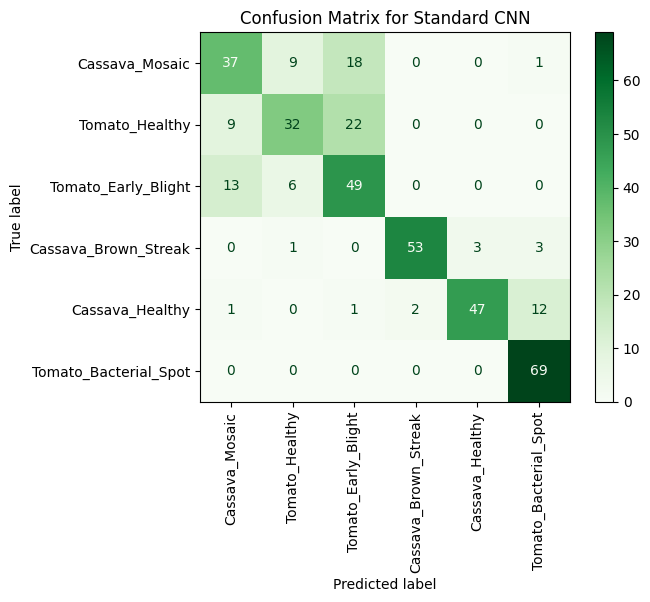

In [72]:
confusion_mtx = confusion_matrix(all_labels, all_preds)
# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mtx, display_labels=diseases)
disp.plot(cmap=plt.cm.Greens)
plt.xticks(rotation=90)     #rotate x-axis horizontally
plt.title("Confusion Matrix for Standard CNN")
plt.show()

<h1>ResNet50 Model</h1>

In [73]:
# Load the ResNet50 model
resnet_model = torchvision.models.resnet50(pretrained=True)

# Parallelize training across multiple GPUs
resnet_model = nn.DataParallel(resnet_model)

# Set the model to run on the device
resnet_model = resnet_model.to(device)

resnet_model

/opt/anaconda3/envs/torch-env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/torch-env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /Users/ojokivan/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

DataParallel(
  (module): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

In [74]:
# Define the loss function and optimizer
# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.Adam(resnet_model.parameters(), lr=0.001)

<h3>ResNet50 Model Training</h3>

In [75]:
#Training the model
num_epochs=10
for epoch in range(num_epochs):
 # Iterate over training batches
   print(f"Epoch [{epoch + 1}/{num_epochs}]")

   for batch_index, (data, targets) in enumerate(tqdm(train_dl)):

     # Move data (input) and targets (label) tensors to the device
     data = data.to(device)
     targets = targets.to(device)

     # Zero out the optimizer
     optimizer.zero_grad()

     # Forward pass (scores/output)
     scores = resnet_model(data)
     loss = criterion(scores, targets)

     # Backward pass
     loss.backward()
     optimizer.step()


Epoch [1/10]


100%|███████████████████████████████████████████| 62/62 [36:37<00:00, 35.44s/it]


Epoch [2/10]


100%|███████████████████████████████████████████| 62/62 [56:47<00:00, 54.96s/it]


Epoch [3/10]


100%|███████████████████████████████████████████| 62/62 [40:17<00:00, 39.00s/it]


Epoch [4/10]


100%|███████████████████████████████████████████| 62/62 [23:55<00:00, 23.16s/it]


Epoch [5/10]


100%|███████████████████████████████████████████| 62/62 [23:09<00:00, 22.41s/it]


Epoch [6/10]


100%|███████████████████████████████████████████| 62/62 [27:49<00:00, 26.92s/it]


Epoch [7/10]


100%|███████████████████████████████████████████| 62/62 [26:26<00:00, 25.58s/it]


Epoch [8/10]


100%|████████████████████████████████████████| 62/62 [1:49:39<00:00, 106.12s/it]


Epoch [9/10]


100%|███████████████████████████████████████████| 62/62 [27:49<00:00, 26.92s/it]


Epoch [10/10]


100%|███████████████████████████████████████████| 62/62 [32:12<00:00, 31.16s/it]


<h3>ResNet 50 Model Prediction and Evaluation</h3>

In [76]:
from sklearn.metrics import confusion_matrix

all_preds = []
all_labels = []

resnet_model.eval()
with torch.no_grad():
  for images, labels in test_dl:
    outputs = resnet_model(images)
    _, predicted = torch.max(outputs.data, 1) # Get predicted class indices
    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

report = classification_report(all_labels, all_preds, target_names=diseases)
accuracy = accuracy_score(all_labels, all_preds)
print(f"Accuracy: {accuracy*100} %")
print("ResNet50 Classification Report")
print(report)

Accuracy: 81.95876288659794 %
ResNet50 Classification Report
                       precision    recall  f1-score   support

       Cassava_Mosaic       0.76      0.82      0.79        65
       Tomato_Healthy       0.80      0.97      0.88        63
  Tomato_Early_Blight       0.98      0.71      0.82        68
 Cassava_Brown_Streak       0.98      0.93      0.96        60
      Cassava_Healthy       0.64      1.00      0.78        63
Tomato_Bacterial_Spot       1.00      0.54      0.70        69

             accuracy                           0.82       388
            macro avg       0.86      0.83      0.82       388
         weighted avg       0.86      0.82      0.82       388



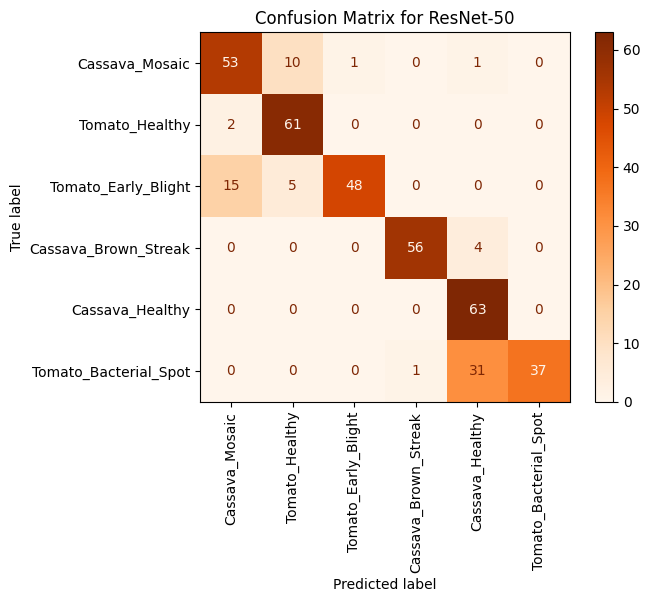

In [77]:
confusion_mtx = confusion_matrix(all_labels, all_preds)
# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mtx, display_labels=diseases)
disp.plot(cmap=plt.cm.Oranges)
plt.xticks(rotation=90)     #rotate x-axis horizontally
plt.title("Confusion Matrix for ResNet-50")
plt.show()

<hThe End